In [1]:
import cv2 
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

from tensorflow import keras #saving model
from keras import layers #
from keras import models 
from keras import optimizers 
from keras.preprocessing.image import ImageDataGenerator 
from keras.preprocessing.image import img_to_array,load_img

In [2]:
model=keras.models.load_model('models/yolov2_tiny-face.h5')

In [3]:
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 416, 416, 3)]     0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 416, 416, 16)      432       
_________________________________________________________________
batch_normalization_1 (Batch (None, 416, 416, 16)      64        
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 416, 416, 16)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 208, 208, 16)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 208, 208, 32)      4608      
_________________________________________________________________
batch_normalization_2 (Batch (None, 208, 208, 32)      128 

In [4]:
img_path = r"D:\Personal Documents\Atharva_Kale_ComputerEngg_VIIT.jpeg"
from keras.preprocessing import image

img = image.load_img(img_path, target_size=(416, 416))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.
print(img_tensor.shape)

(1, 416, 416, 3)


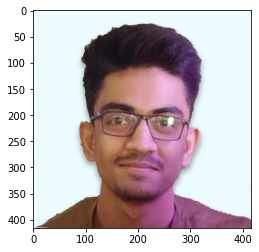

In [5]:
plt.imshow(img_tensor[0])
plt.show()

In [6]:
pred=model.predict(img_tensor)

In [7]:
len(pred[0][0][0])

30

In [8]:
layer_outputs = [layer.output for layer in model.layers[1:]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [9]:
activations = activation_model.predict(img_tensor)

In [10]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 416, 416, 16)


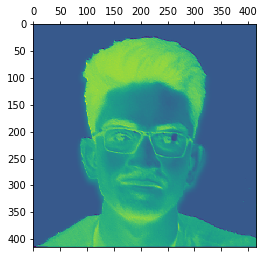

In [11]:
plt.matshow(first_layer_activation[0, :, :, 0], cmap='viridis')

In [12]:
for layer in model.layers[1::]:
#     if "Conv2d" in layer.name:
     print(layer.name)

conv2d_1
batch_normalization_1
leaky_re_lu_1
max_pooling2d_1
conv2d_2
batch_normalization_2
leaky_re_lu_2
max_pooling2d_2
conv2d_3
batch_normalization_3
leaky_re_lu_3
max_pooling2d_3
conv2d_4
batch_normalization_4
leaky_re_lu_4
max_pooling2d_4
conv2d_5
batch_normalization_5
leaky_re_lu_5
max_pooling2d_5
conv2d_6
batch_normalization_6
leaky_re_lu_6
max_pooling2d_6
conv2d_7
batch_normalization_7
leaky_re_lu_7
conv2d_8
batch_normalization_8
leaky_re_lu_8
conv2d_9


In [13]:
for layer in model.layers[2:8:]:
    print(layer.name)

batch_normalization_1
leaky_re_lu_1
max_pooling2d_1
conv2d_2
batch_normalization_2
leaky_re_lu_2


In [14]:
len(model.layers)

32

C:\Users\Atharva\Anaconda3\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


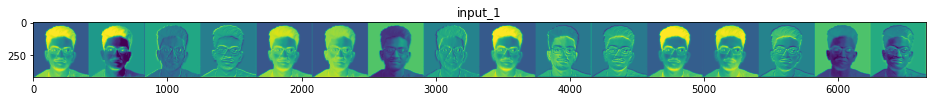

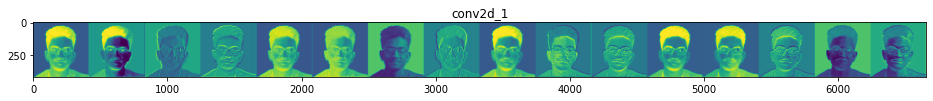

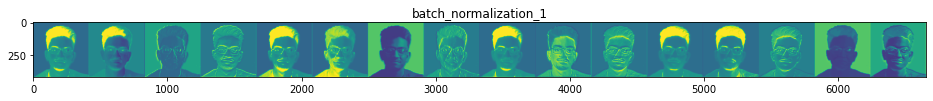

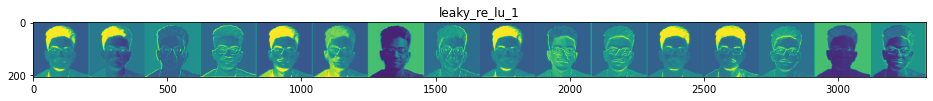

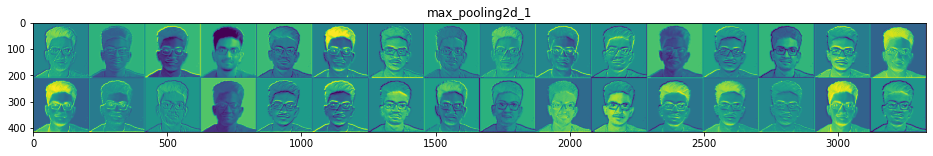

...

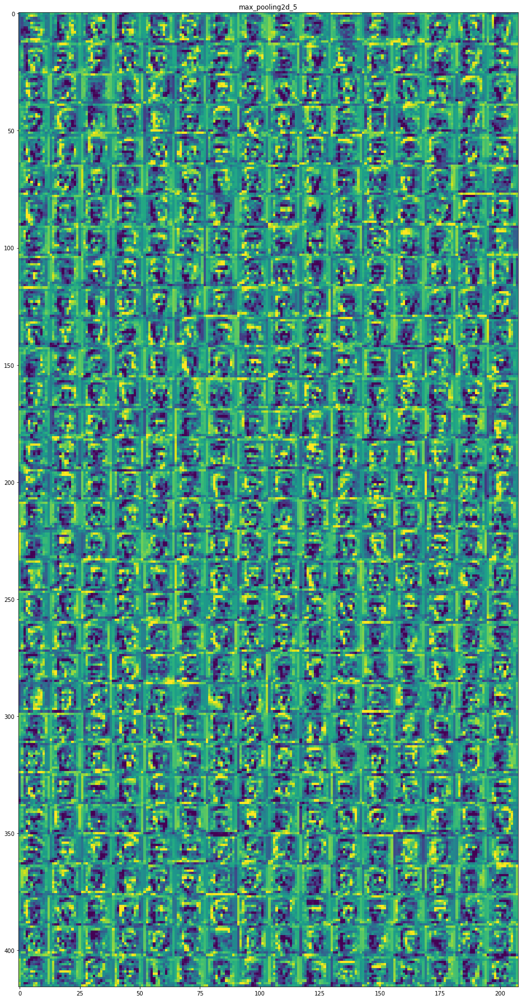

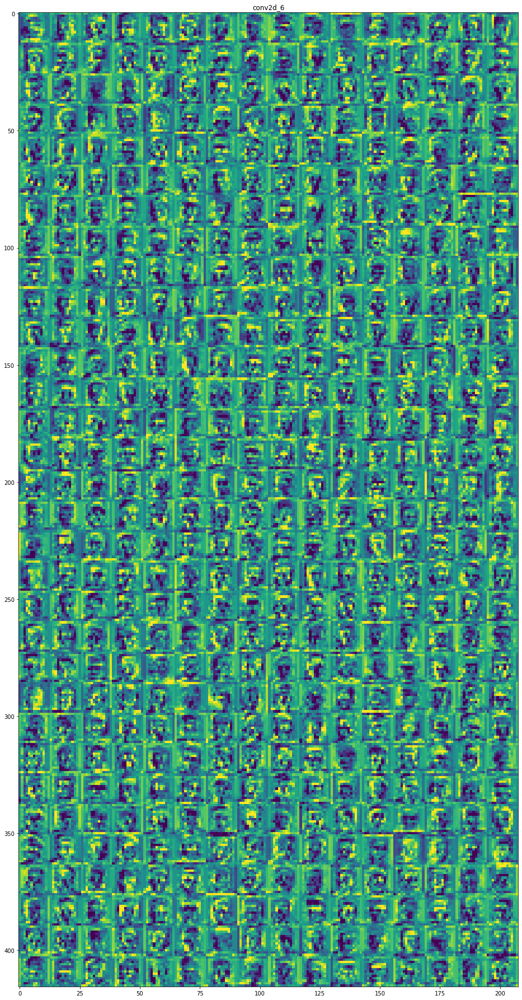

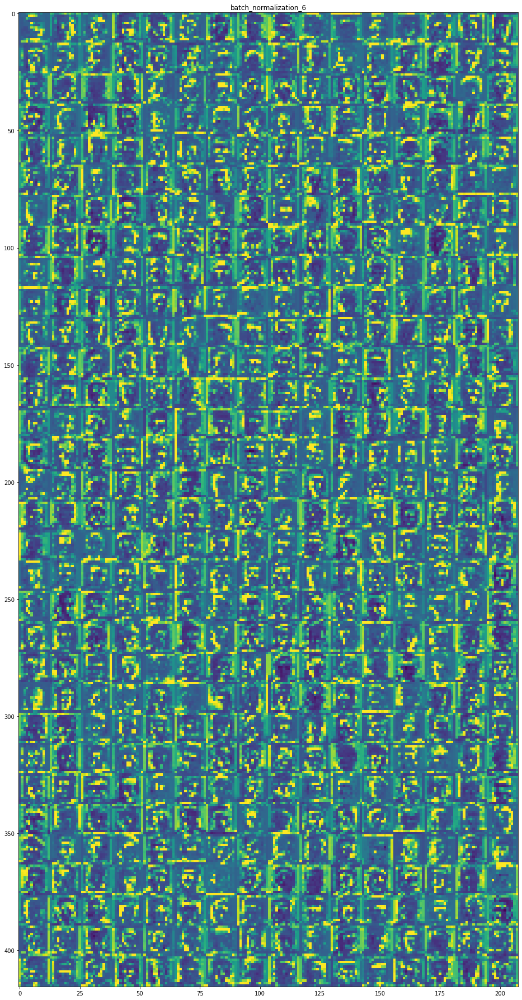

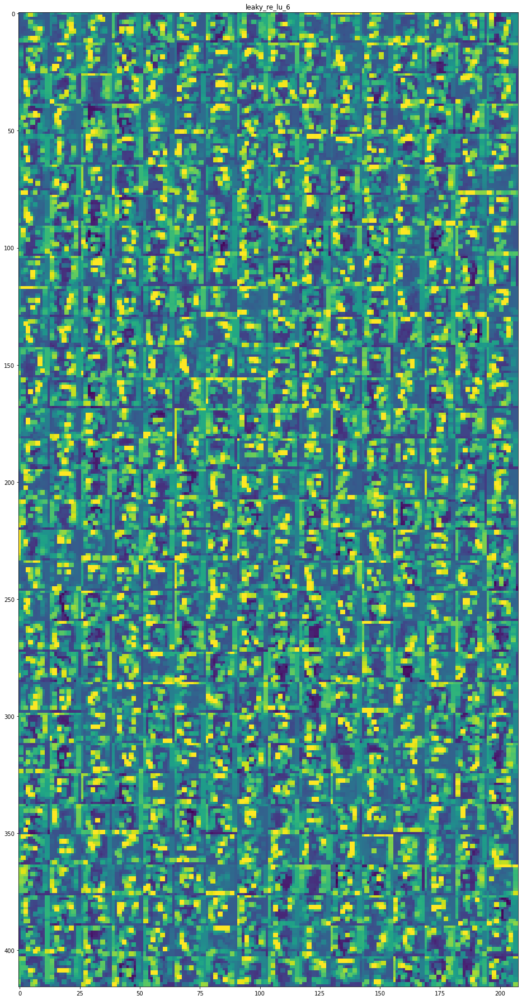

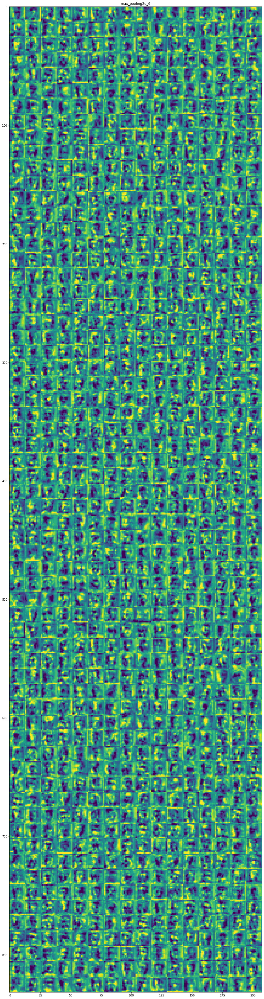

In [21]:
layer_names = []
for layer in model.layers[:25:]:
#     if "Conv2d" in layer.name:
    layer_names.append(layer.name)
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,:, :,col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
            row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
    scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')